In [1]:
# coding=utf-8
#
# The copyright of this file belongs to Feedzai. The file cannot be
# reproduced in whole or in part, stored in a retrieval system,
# transmitted in any form, or by any means electronic, mechanical,
# photocopying, or otherwise, without the prior permission of the owner.
#
# (c) 2022 Feedzai, Strictly Confidential

In [2]:
import lightgbm as lgbm  # Tested ML method
import numpy as np       # Random number generation
import seaborn as sns    # Plotting library
import pandas as pd      # Read/write data
import yaml              # Read hyperparameter space configuration

from aequitas.group import Group                # Fairness metrics
from matplotlib import pyplot as plt            # Plotting method
from sklearn.preprocessing import LabelEncoder  # Categorical encoding for LGBM models
from sklearn import metrics                     # ROC metrics

from random_search import RandomValueTrial, suggest_callable_hyperparams  # Random search wrapper methods
import copy

c:\Users\gabri\Desktop\Thesis\tese\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
# Read hyperparameter space for the LGBM Models, expected structure is presented bellow
with open("lightgbm_hyperparameter_space.yaml", "r") as file:
    hyperparam_space = yaml.load(file, Loader=yaml.FullLoader)

In [4]:
# The expected structure is the following:
hyperparam_space

{'LightGBM': {'classpath': 'lightgbm.LGBMClassifier',
  'kwargs': {'n_estimators': {'type': 'int',
    'range': [20, 10000],
    'log': True},
   'max_depth': {'type': 'int', 'range': [3, 30]},
   'learning_rate': {'type': 'float', 'range': [0.02, 0.1], 'log': True},
   'num_leaves': {'type': 'int', 'range': [10, 100], 'log': True},
   'boosting_type': ['gbdt', 'goss'],
   'min_data_in_leaf': {'type': 'int', 'range': [5, 200], 'log': True},
   'max_bin': {'type': 'int', 'range': [100, 500]},
   'enable_bundle': [True, False]}}}

In [5]:
# Testing a random search suggestion:
trial = RandomValueTrial(seed=1)
suggest_callable_hyperparams(trial, hyperparam_space)

{'classpath': 'lightgbm.LGBMClassifier',
 'n_estimators': 263,
 'max_depth': 23,
 'learning_rate': 0.020003681922217444,
 'num_leaves': 19,
 'boosting_type': 'gbdt',
 'min_data_in_leaf': 9,
 'max_bin': 238,
 'enable_bundle': False}

In [6]:
# Define path to datasets. Replace `base_path` with the appropriate value.
base_path = ""

datasets_paths = {
    "Base":    base_path + "base.csv",
    "Base Enhanced":    base_path + "base_enhanced.csv",
    "Variant 5": base_path + "Variant V.csv",
}

In [7]:
# Read the datasets with pandas.
datasets = {key: pd.read_csv(path) for key, path in datasets_paths.items()}

In [8]:
# Define the label field and categorical columns.
label = "fraud_bool"

categorical_features = [
    "payment_type",
    "employment_status",
    "housing_status",
    "source",
    "device_os",
]

In [9]:
# Create the train and test sets. Shuffle data with `sample` method.
# The split was done by month. The first 6 months as the train, the last 2 months as test.
train_dfs = {key: df[df["month"]<6].sample(frac=1, replace=False) for key, df in datasets.items()}
test_dfs = {key: df[df["month"]>=6].sample(frac=1, replace=False) for key, df in datasets.items()}

In [10]:
# Encode the categorical variables in the datasets to integers. 
# This is expected by LGBM (or columns with the `categorical` data type).

for name in datasets.keys():  # For each dataset in the suite
    train = train_dfs[name]
    test = test_dfs[name]

    for feat in categorical_features:
        encoder = LabelEncoder()
        encoder.fit(train[feat])  # Fit an encoder to the train set.
        train[feat] = encoder.transform(train[feat])  # Transform train set.
        test[feat] = encoder.transform(test[feat])    # Transform test set.

In [11]:
# Cell with train loop.

# Define number of trials in Random search.
n_trials=100
# Random state for sampling seeds.
np.random.seed(42)
# Seeds for the random search sampling algorithm.
seeds = np.random.choice(list(range(1_000_000)), size=n_trials, replace=False)

# Variable to store the results.
runs = {}

for trial in range(n_trials):
    print(f"Trial {trial+1}/{n_trials}")
    seed = seeds[trial]
    trial = RandomValueTrial(seed=seed)
    # Hyperparameters for the random search trial.
    test_hyperparams = suggest_callable_hyperparams(trial, hyperparam_space)
    del test_hyperparams["classpath"] # Remove unnecessary key in hyperparaemters.
    
    # Update list of tested hyperparameters.
    prev_hyperparams = runs.get("hyperparams", [])
    prev_hyperparams.append(test_hyperparams)
    runs["hyperparams"] = prev_hyperparams
    
    for dataset_name in datasets.keys():  # Run hyperparameters on all variants of datastes.
        model = lgbm.LGBMClassifier(n_jobs=10, **test_hyperparams)  # Instantiate LGBM Model.
        X_train = train_dfs[dataset_name].drop(columns=["fraud_bool"])
        y_train = train_dfs[dataset_name]["fraud_bool"]
        X_test = test_dfs[dataset_name].drop(columns=["fraud_bool"])
        y_test = test_dfs[dataset_name]["fraud_bool"]
        # Fit model to training data.
        model.fit(X_train, y_train, categorical_feature=categorical_features)
        model.fit(X_train, y_train)
        # Obtain predictions in test data.
        predictions = model.predict_proba(X_test)[:, 1]
        
        # Obtain ROC curve for the predictions.
        fprs, tprs, thresholds = metrics.roc_curve(y_test, predictions)
        # Obtain threshold and recall. We select 5% FPR as threshold.
        threshold = np.min(thresholds[fprs==max(fprs[fprs < 0.05])])
        recall = np.max(tprs[fprs==max(fprs[fprs < 0.05])])

        # Binarize predictions for Aequitas.
        preds_binary = (predictions > threshold).astype(int)
        
        # Create a dataframe with protected group column, predictions and labels.
        # Here, we select age>=50 as threshold.
        aequitas_df = pd.DataFrame(
            {
                "age": (X_test["customer_age"]>=50).map({True: "Older", False: "Younger"}),
                "preds": preds_binary,
                "y": y_test.values
            }
        )
        
        # Obtain FPR results for different groups.
        g = Group()
        aequitas_results = g.get_crosstabs(aequitas_df, attr_cols=["age"], score_col="preds", label_col="y")[0]
        
        # Store the results for the trained model
        results = {}
        results["recall"] = recall
        results["recall Older"] = aequitas_results[aequitas_results["attribute_value"] == "Older"][["tpr"]].values[0][0]
        results["recall Younger"] = aequitas_results[aequitas_results["attribute_value"] == "Younger"][["tpr"]].values[0][0]
        results["fpr Older"] = aequitas_results[aequitas_results["attribute_value"] == "Older"][["fpr"]].values[0][0]
        results["fpr Younger"] = aequitas_results[aequitas_results["attribute_value"] == "Younger"][["fpr"]].values[0][0]
        
        # Store the results in the runs variable
        prev_runs = runs.get(dataset_name, [])
        prev_runs.append(results)
        runs[dataset_name] = prev_runs

Trial 1/100
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] min_data_in_leaf is set=22, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=22
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 8151, number of negative: 786838
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.024066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Tot

In [12]:
# Create a dataframe with the results for each model in each dataset.
rs_results = pd.DataFrame(runs)

In [13]:
# Helper method to obtain the metric values for a given model.
def get_results(results, variant, metric):
    col = results[variant]
    values = []
    # for idx, val in col.iteritems():
    for idx, val in col.items():
        values.append(val[metric])
    return values

In [14]:
# Obtain the relevant metrics to plots from the dataframe.
variants = list(datasets_paths.keys())

plot_results = {"Variant": [], "Recall": [], "FPR Ratio": []}

for variant in variants:
    plot_results["Recall"] += get_results(rs_results, variant, "recall")
    # Obtain the FPR if both groups.
    for fpr_younger, fpr_older in zip(get_results(rs_results, variant, "fpr Younger"), get_results(rs_results, variant, "fpr Older")):
        # Calculate FPR ratio as higher fpr / lower fpr
        if fpr_younger > fpr_older:
            plot_results["FPR Ratio"] += [fpr_older/fpr_younger]
        else:
            plot_results["FPR Ratio"] += [fpr_younger/fpr_older]
    plot_results["Variant"] += [variant] * len(get_results(rs_results, variant, "recall"))

# Create a dataframe for easier plots.
plot_results = pd.DataFrame(plot_results)

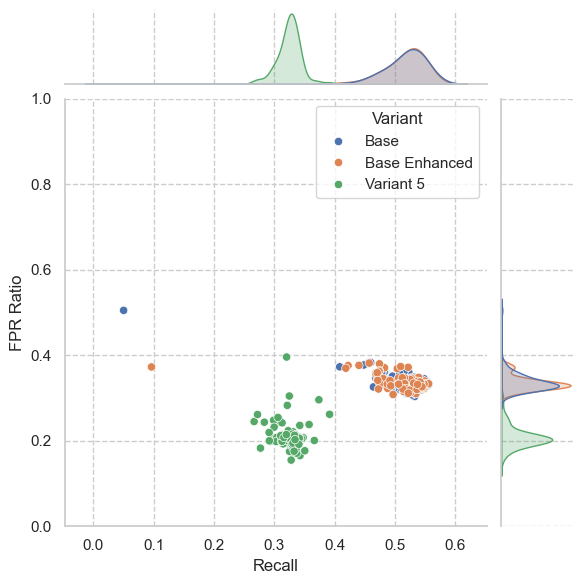

In [15]:
# Create a plot with the full results of the random search algorithm.
sns.set()
sns.set_style("whitegrid", {"grid.linestyle": "--"})

sns.jointplot(data=plot_results, x="Recall", y="FPR Ratio", hue="Variant")
plt.ylim((0,1));

plt.savefig("random_search_results.png")

In [16]:
# Create the final plot. Highlight the top models:
top_n = 5
top_models_base = plot_results.loc[plot_results['Variant'] == 'Base'].sort_values('Recall', ascending=False).head(top_n).index.values
top_models = copy.deepcopy(top_models_base)
for i in range(1, 6):
    top_models = np.r_[top_models, top_models_base + (100 * i)]

plot_results['index'] = plot_results.index
plot_results['is_top'] = plot_results.apply(lambda x: 1 if x['index'] in top_models else 0, axis=1)

C:\Users\gabri\AppData\Local\Temp\ipykernel_4848\1027910339.py:16: UserWarning: The palette list has more values (4) than needed (1), which may not be intended.
  sns.scatterplot(ax=ax2, data=plot_results.loc[(~plot_results.index.isin(top_models)) & (plot_results["Variant"].isin(["Base", "Type II", "Type V", "Type IV"])), :], x="Recall", y="FPR Ratio", hue="Variant", alpha=0.2, palette=[sns.color_palette()[0], sns.color_palette()[2], sns.color_palette()[4], sns.color_palette()[5]], legend=False)
C:\Users\gabri\AppData\Local\Temp\ipykernel_4848\1027910339.py:17: UserWarning: The palette list has more values (4) than needed (1), which may not be intended.
  sns.scatterplot(ax=ax2, data=plot_results.loc[(plot_results.index.isin(top_models)) & (plot_results["Variant"].isin(["Base", "Type II", "Type V", "Type IV"])), :], x="Recall", y="FPR Ratio", hue="Variant", palette=[sns.color_palette()[0], sns.color_palette()[2], sns.color_palette()[4], sns.color_palette()[5]], legend=False)


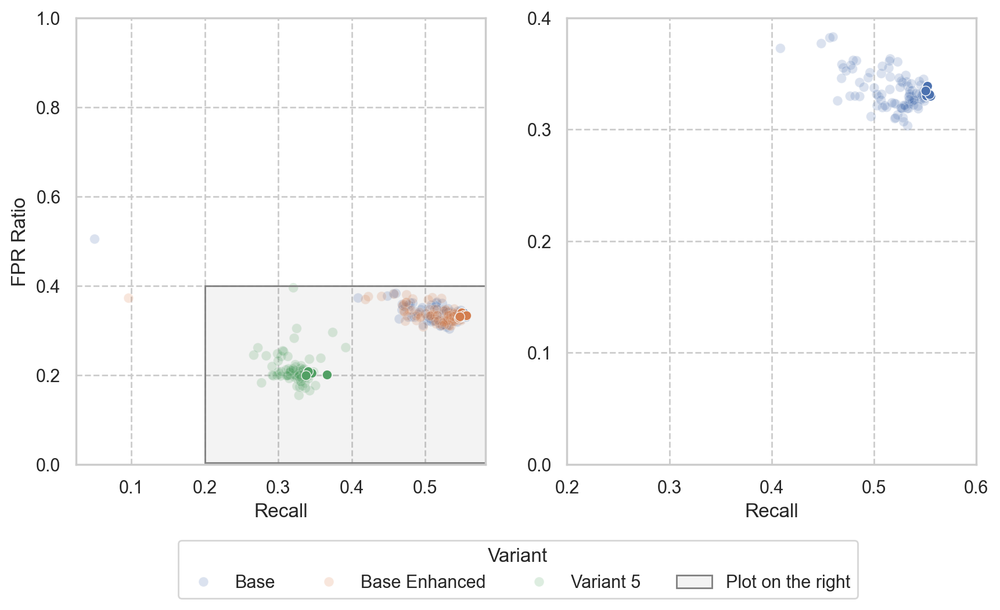

In [17]:
sns.set_style("whitegrid", {"grid.linestyle": "--", "grid.alpha":0.1})
DPI = 200
plt.rcParams['figure.dpi'] = DPI
plt.rcParams['figure.figsize'] = (10,5)

fig, (ax1, ax2) = plt.subplots(1, 2)

# LEFT PLOT
sns.scatterplot(ax=ax1, data=plot_results.loc[(~plot_results.index.isin(top_models)), :], x="Recall", y="FPR Ratio", hue="Variant", alpha=0.2)
sns.scatterplot(ax=ax1, data=plot_results.loc[plot_results.index.isin(top_models), :], x="Recall", y="FPR Ratio", hue="Variant", legend=False)
ax1.set(
    ylim=(0,1)
)

# RIGHT PLOT
sns.scatterplot(ax=ax2, data=plot_results.loc[(~plot_results.index.isin(top_models)) & (plot_results["Variant"].isin(["Base", "Type II", "Type V", "Type IV"])), :], x="Recall", y="FPR Ratio", hue="Variant", alpha=0.2, palette=[sns.color_palette()[0], sns.color_palette()[2], sns.color_palette()[4], sns.color_palette()[5]], legend=False)
sns.scatterplot(ax=ax2, data=plot_results.loc[(plot_results.index.isin(top_models)) & (plot_results["Variant"].isin(["Base", "Type II", "Type V", "Type IV"])), :], x="Recall", y="FPR Ratio", hue="Variant", palette=[sns.color_palette()[0], sns.color_palette()[2], sns.color_palette()[4], sns.color_palette()[5]], legend=False)
ax2.set(
    ylim=(0,0.4),
    ylabel="",
    xticks=np.arange(0.2, 0.8, 0.1),
    yticks=np.arange(0, 0.5, 0.1),
    xlim=(0.2, 0.6),
)

rect = plt.Rectangle((0.2, 0.004), 0.4, 0.396, facecolor=(0.1, 0.1, 0.1, 0.05), edgecolor="grey", linestyle="-")
ax1.add_patch(rect)
handles, labels = ax1.get_legend_handles_labels()
handles = list(handles) + [rect]
labels = list(labels) + ["Plot on the right"]
ax1.legend(handles, labels, title="Variant")

sns.move_legend(
    ax1,
    loc="lower center",
    bbox_to_anchor=[1.08, -0.32],
    ncol=7
)

In [43]:
pd.set_option('display.max_colwidth', None)
top_n = 5
variants_to_process = ['Base', 'Base Enhanced', 'Variant 5']
output_file = "top_5_models.txt"

with open(output_file, "w") as f:
    for variant in variants_to_process:
        f.write(f"Top {top_n} models for variant: {variant}\n")
        f.write("="*80 + "\n\n")
        
        # Get top models for this variant
        top_models_variant = plot_results.loc[plot_results['Variant'] == variant].sort_values('Recall', ascending=False).head(top_n)
        
        for idx, (model_idx, row) in enumerate(top_models_variant.iterrows(), 1):
            # Calculate the trial index (model_idx % 100 gets the trial number)
            trial_idx = model_idx % 100
            params = rs_results['hyperparams'].iloc[trial_idx]
            
            f.write(f"Model {idx}:\n")
            f.write(f"  Index: {model_idx}\n")
            f.write(f"  Recall: {row['Recall']:.4f}\n")
            f.write(f"  FPR Ratio: {row['FPR Ratio']:.4f}\n")
            f.write(f"  Hyperparameters:\n")
            for param_name, param_value in params.items():
                f.write(f"    {param_name}: {param_value}\n")
            f.write("\n")
        
        f.write("\n" + "="*80 + "\n\n")

print(f"Results saved to {output_file}")

Results saved to top_5_models.txt
